<a href="https://colab.research.google.com/github/youssef2620/ASDC/blob/main/Ai%20Densitry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Install Detectron2

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2' already exists and is not an empty directory.


In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


# Importing Needed Libraries

In [4]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo # we are importing model_zoo cause we are goint to experiment it initially on a pre-trained model then we are going with our model
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

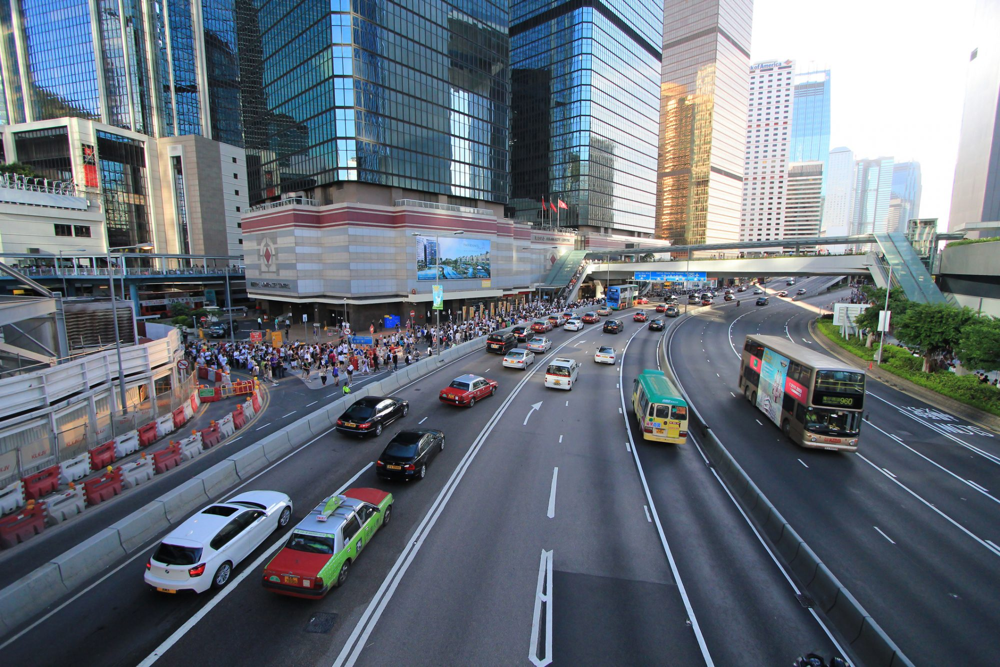

In [5]:
# we will run a pre-trained model on the following image
im_trial = cv2.imread("/content/drive/MyDrive/road.jpg")
cv2_imshow(im_trial)

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im_trial)

[12/31 08:32:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 7, 2, 2, 7, 5], device='cuda:0')
Boxes(tensor([[1.1872e+03, 6.9324e+02, 1.2331e+03, 7.2970e+02],
        [1.4756e+03, 6.6362e+02, 1.7369e+03, 9.0521e+02],
        [8.7420e+02, 7.4641e+02, 9.9793e+02, 8.1582e+02],
        [1.2961e+03, 6.3507e+02, 1.3300e+03, 6.6246e+02],
        [1.2038e+03, 6.3868e+02, 1.2450e+03, 6.6702e+02],
        [6.6980e+02, 7.9030e+02, 8.2083e+02, 8.7590e+02],
        [7.4950e+02, 8.5585e+02, 8.9783e+02, 9.6544e+02],
        [1.0038e+03, 6.9388e+02, 1.0679e+03, 7.4082e+02],
        [1.2652e+03, 6.2451e+02, 1.2929e+03, 6.4507e+02],
        [2.8423e+02, 9.8460e+02, 5.8712e+02, 1.1922e+03],
        [1.0536e+03, 6.7293e+02, 1.1035e+03, 7.0731e+02],
        [1.1263e+03, 6.3534e+02, 1.1655e+03, 6.6181e+02],
        [1.4476e+03, 5.8174e+02, 1.4706e+03, 6.0390e+02],
        [1.5108e+03, 5.9591e+02, 1.5346e+03, 6.1345e+02],
        [1.0872e+03, 7.1755e+02, 1.1606e+03, 7

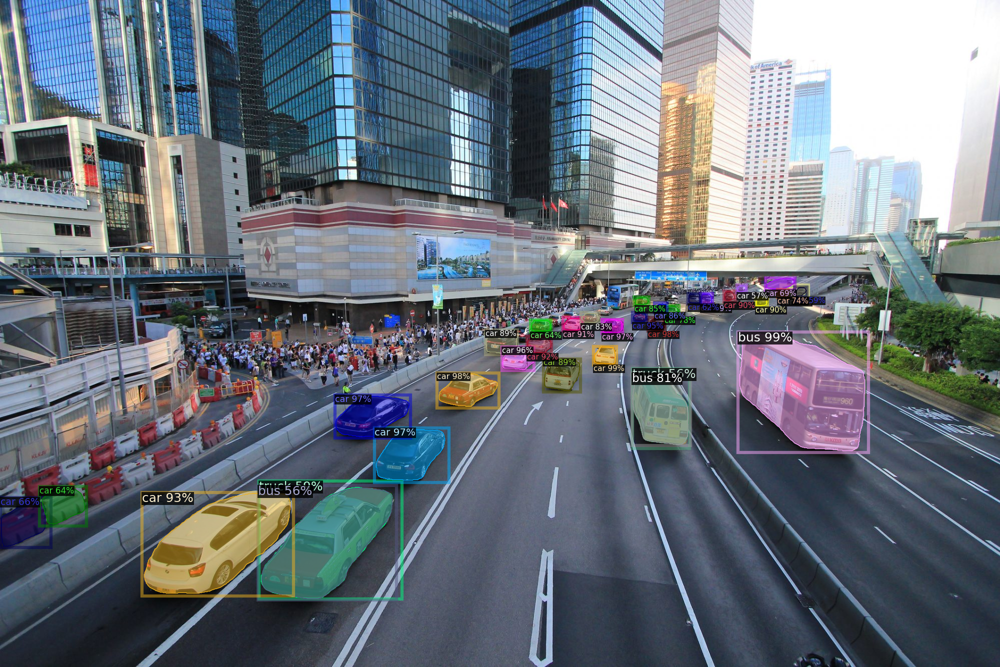

In [8]:
#We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im_trial[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

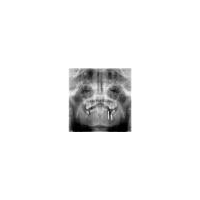

In [9]:
#now we tried it on a custom image, what about to try it on a random test image from my dataset
test_im = cv2.imread("/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/0000030_png_jpg.rf.31f3365b21b3a2fa618cb17af9416524.jpg")
# Resize the image to 64x64
resized_im = cv2.resize(test_im, (64, 64))

# Create a blank white image of the desired size (e.g., 200x200)
desired_size = 200
blank_image = np.ones((desired_size, desired_size, 3), dtype=np.uint8) * 255  # White image

# Calculate the position to place the resized image in the center
x_offset = (desired_size - 64) // 2
y_offset = (desired_size - 64) // 2

# Place the resized image in the center of the blank image
blank_image[y_offset:y_offset+64, x_offset:x_offset+64] = resized_im

# Display the image with padding
cv2_imshow(blank_image)

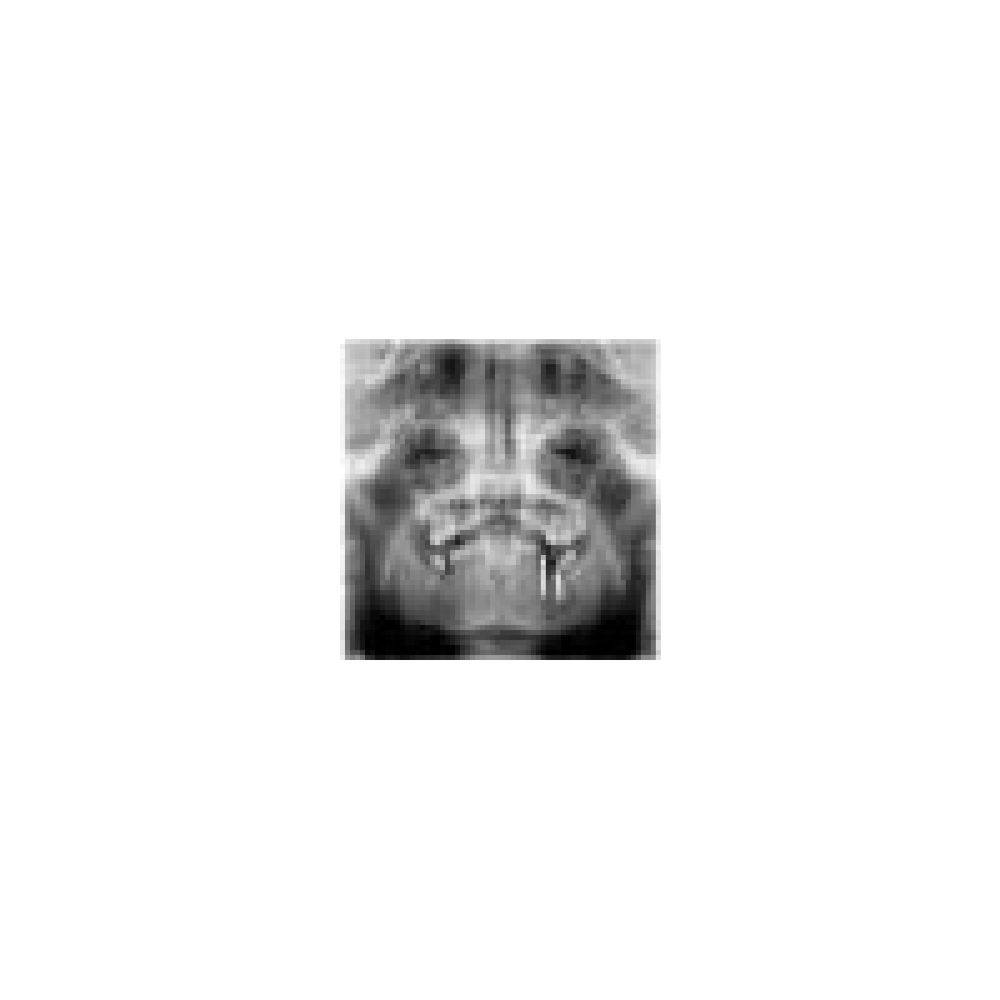

In [10]:
sci_outputs = predictor(test_im)
sci_v = Visualizer(blank_image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),scale = 6.0)
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
cv2_imshow(sci_out.get_image()[:, :, ::-1])


Of course, our cells are mislabeled, lets begin

## Registering my dataset

In [11]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/train/_annotations.coco.json", "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/_annotations.coco.json", "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid")


In [12]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

WARNING [12/31 08:32:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/31 08:32:16 d2.data.datasets.coco]: Loaded 452 images in COCO format from /content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/train/_annotations.coco.json


In [13]:
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

WARNING [12/31 08:32:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/31 08:32:16 d2.data.datasets.coco]: Loaded 113 images in COCO format from /content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/_annotations.coco.json


## Visualizing Some random samples

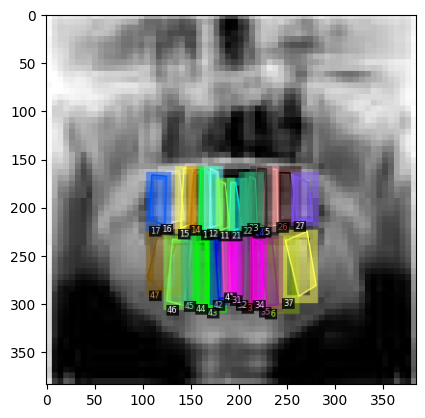

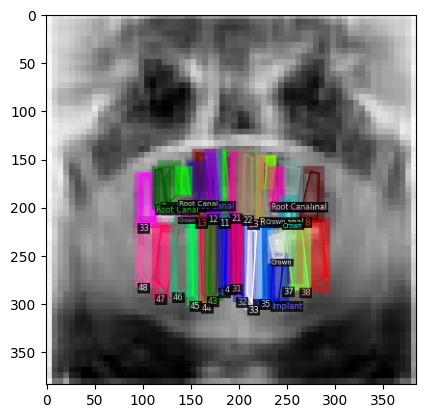

In [14]:
from matplotlib import pyplot as plt

for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=6.0)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

## Training

In [15]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 2000
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 35

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False)

[12/31 08:32:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [16]:
trainer.train() #Start the training process

[12/31 08:32:18 d2.engine.train_loop]: Starting training from iteration 0
[12/31 08:32:28 d2.utils.events]:  eta: 0:14:14  iter: 19  total_loss: 8.782  loss_cls: 3.566  loss_box_reg: 0.1417  loss_mask: 0.6935  loss_rpn_cls: 3.981  loss_rpn_loc: 0.4334    time: 0.4691  last_time: 0.5539  data_time: 0.0219  last_data_time: 0.0116   lr: 4.9953e-06  max_mem: 2059M
[12/31 08:32:44 d2.utils.events]:  eta: 0:15:44  iter: 39  total_loss: 6.271  loss_cls: 3.379  loss_box_reg: 0.3067  loss_mask: 0.6934  loss_rpn_cls: 1.505  loss_rpn_loc: 0.3966    time: 0.4989  last_time: 0.4172  data_time: 0.0201  last_data_time: 0.0064   lr: 9.9902e-06  max_mem: 2314M
[12/31 08:32:53 d2.utils.events]:  eta: 0:15:11  iter: 59  total_loss: 5.028  loss_cls: 3.07  loss_box_reg: 0.5485  loss_mask: 0.6934  loss_rpn_cls: 0.356  loss_rpn_loc: 0.3637    time: 0.4832  last_time: 0.4915  data_time: 0.0069  last_data_time: 0.0143   lr: 1.4985e-05  max_mem: 2314M
[12/31 08:33:02 d2.utils.events]:  eta: 0:15:04  iter: 79  t

In [18]:
import yaml
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)


## Inference and evaluation


In [19]:
# Inference should use the config with parameters that are used in training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[12/31 08:52:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ColabNotebooks/models/Detectron2/model_final.pth ...


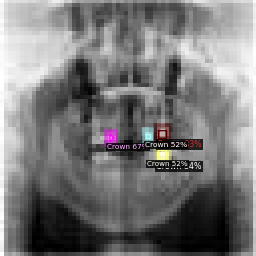

In [30]:
#verify results on random image
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=4.0,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [31]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[12/31 08:55:51 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [12/31 08:55:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/31 08:55:52 d2.data.datasets.coco]: Loaded 113 images in COCO format from /content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/_annotations.coco.json
[12/31 08:55:52 d2.data.build]: Distribution of instances among all 36 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   tooth    | 0            |     11     | 107          |     12     | 106          |
|     13     | 102          |     14     | 98           |     15     | 89           |
|     16     | 85           |     17     | 89           |     18     | 62           |
|     21     | 106          |     22     | 108          |     23     | 106

In [38]:
import os
import cv2
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import Visualizer

# Directory path to the input images folder
input_images_directory = "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/"

# Output directory where the segmented images will be saved
output_directory = "/content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid_results/"

if not os.path.exists(output_directory):
    os.makedirs(output_directory)

predictor = DefaultPredictor(cfg)

# Assuming "my_dataset_train" is the dataset you registered
train_metadata = MetadataCatalog.get("my_dataset_train")

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)

    # Load the image
    new_im = cv2.imread(image_path)
    if new_im is None:
        print(f"Error loading image: {image_path}")
        continue  # Skip to the next iteration if there's an issue with the image

    try:
        # Perform prediction on the new image
        outputs = predictor(new_im)

        # We can use `Visualizer` to draw the predictions on the image.
        v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

        # Create the output filename with _result extension
        result_filename = os.path.splitext(image_filename)[0] + "_result.png"
        output_path = os.path.join(output_directory, result_filename)

        # Save the segmented image
        cv2.imwrite(output_path, out.get_image())
    except Exception as e:
        print(f"Error processing image {image_filename}: {e}")

print("Segmentation of all images completed.")


[12/31 09:06:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ColabNotebooks/models/Detectron2/model_final.pth ...
Error loading image: /content/drive/MyDrive/Ai Densitry /Dentistry.v2i.coco/valid/_annotations.coco.json
Segmentation of all images completed.
